# Notebook for demonstrating function approximation

In [1]:
import numpy as np
from matplotlib import pyplot as plt
from mpl_toolkits import mplot3d
import itertools
import random

random.seed(0)

import torch
import torch.nn as nn
import torch.nn.functional as F

%matplotlib inline

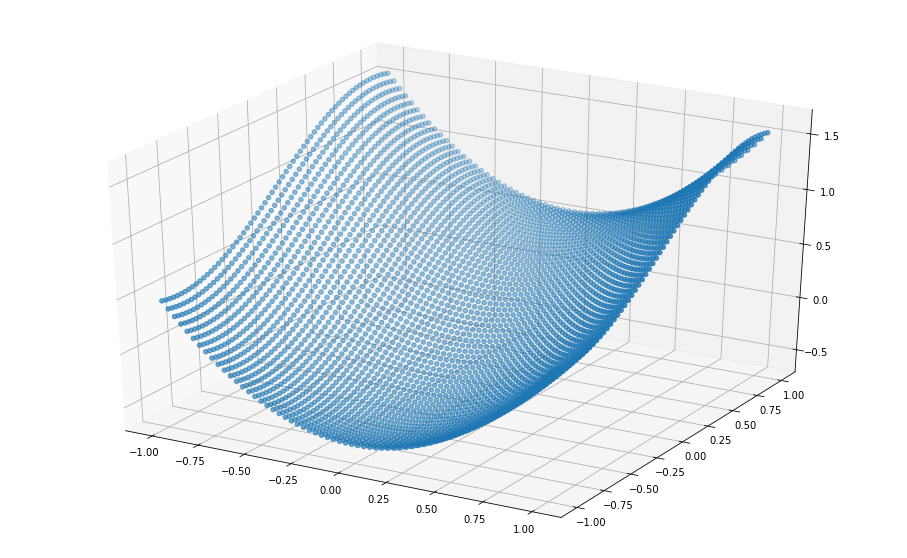

In [59]:
LINSPACE_SIZE = 64

L = np.linspace(-1, 1, LINSPACE_SIZE, dtype=np.float32)

X, Y = np.meshgrid(L, L)

def f(X, Y):
    Z = np.array(X) * np.array(X) + np.array(Y) * np.cos(np.array(Y))
    return Z

Z = f(X, Y)

ORIG_ZLIMS = (-0.5, 1.5)
fig = plt.figure(figsize=(16,10))
ax = plt.axes(projection='3d')

ax.scatter(X, Y, Z)

In [60]:
class Net(nn.Module):

    def __init__(self):
        super(Net, self).__init__()
        
        self.fc1 = nn.Linear(2, 256).cuda()
        self.fc2 = nn.Linear(256, 128).cuda()
        self.fc3 = nn.Linear(128, 64).cuda()
        self.fc4 = nn.Linear(64, 32).cuda()
        self.fc5 = nn.Linear(32, 16).cuda()
        self.output = nn.Linear(16, 1).cuda()
        

    def forward(self, x):
        x = F.relu(self.fc1(x.cuda()))
        x = F.relu(self.fc2(x))
        x = F.relu(self.fc3(x))
        x = F.relu(self.fc4(x))
        x = F.relu(self.fc5(x))
        x = self.output(x)
        
        return x


Device is cuda:0
EPOCH 0
full loss 0.2850748896598816
0# 1 out of 16 with loss tensor(0.2893, device='cuda:0', grad_fn=<MseLossBackward>)
0# 9 out of 16 with loss tensor(0.1765, device='cuda:0', grad_fn=<MseLossBackward>)
EPOCH 100
full loss 0.03199528902769089
100# 1 out of 16 with loss tensor(0.0871, device='cuda:0', grad_fn=<MseLossBackward>)
100# 9 out of 16 with loss tensor(0.0007, device='cuda:0', grad_fn=<MseLossBackward>)
EPOCH 200
full loss 0.002152903936803341
200# 1 out of 16 with loss tensor(0.0047, device='cuda:0', grad_fn=<MseLossBackward>)
200# 9 out of 16 with loss tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward>)
EPOCH 300
full loss 0.0010755048133432865
300# 1 out of 16 with loss tensor(0.0035, device='cuda:0', grad_fn=<MseLossBackward>)
300# 9 out of 16 with loss tensor(0.0001, device='cuda:0', grad_fn=<MseLossBackward>)
EPOCH 400
full loss 0.0004027376417070627
400# 1 out of 16 with loss tensor(0.0012, device='cuda:0', grad_fn=<MseLossBackward>)
400# 9 out 

<ipython-input-78-2fbb376bd19f>:162: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(16,10))


EPOCH 700
full loss 0.00015803090354893357
700# 1 out of 16 with loss tensor(0.0003, device='cuda:0', grad_fn=<MseLossBackward>)
700# 9 out of 16 with loss

<ipython-input-78-2fbb376bd19f>:118: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(16,10))


 tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward>)
EPOCH 800
full loss 0.0012823662254959345
800# 1 out of 16 with loss tensor(0.0036, device='cuda:0', grad_fn=<MseLossBackward>)
800# 9 out of 16 with loss tensor(0.0016, device='cuda:0', grad_fn=<MseLossBackward>)
EPOCH 900
full loss 0.0020045628771185875
900# 1 out of 16 with loss tensor(0.0064, device='cuda:0', grad_fn=<MseLossBackward>)
900# 9 out of 16 with loss tensor(0.0011, device='cuda:0', grad_fn=<MseLossBackward>)


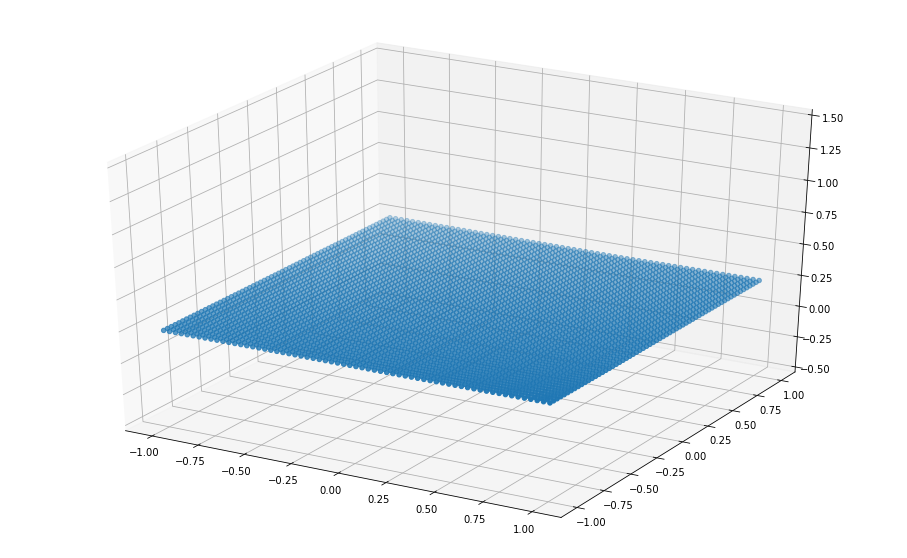

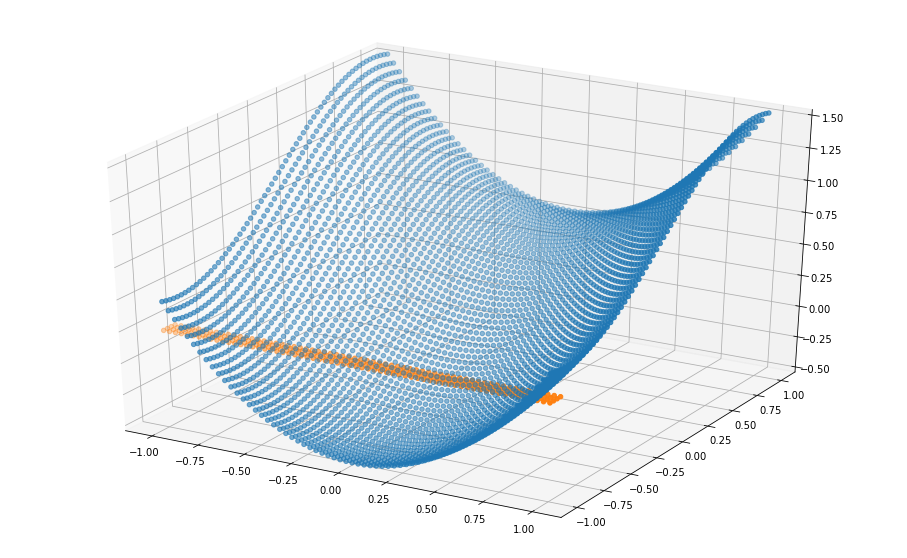

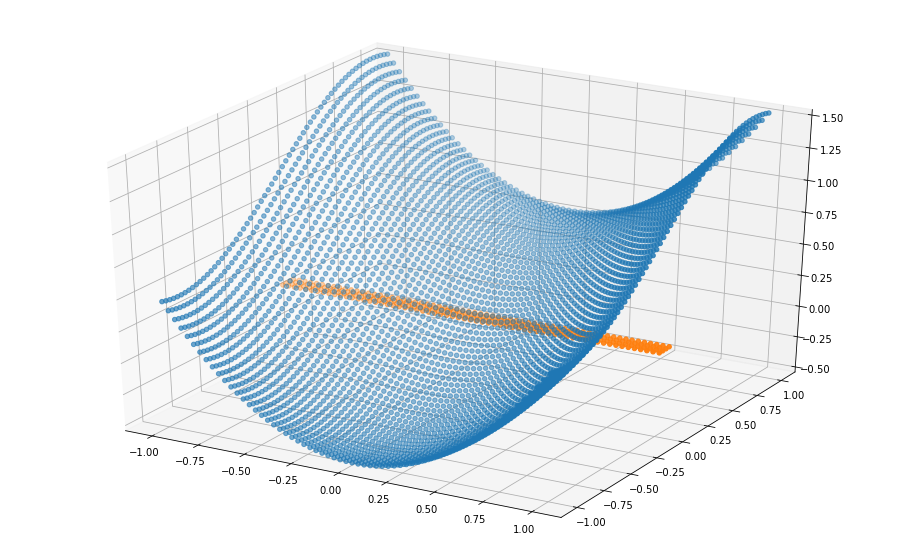

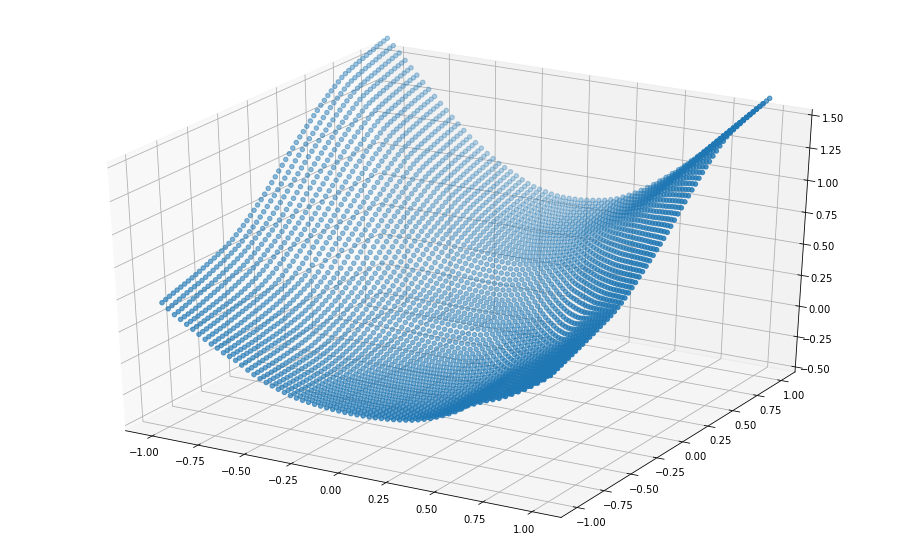

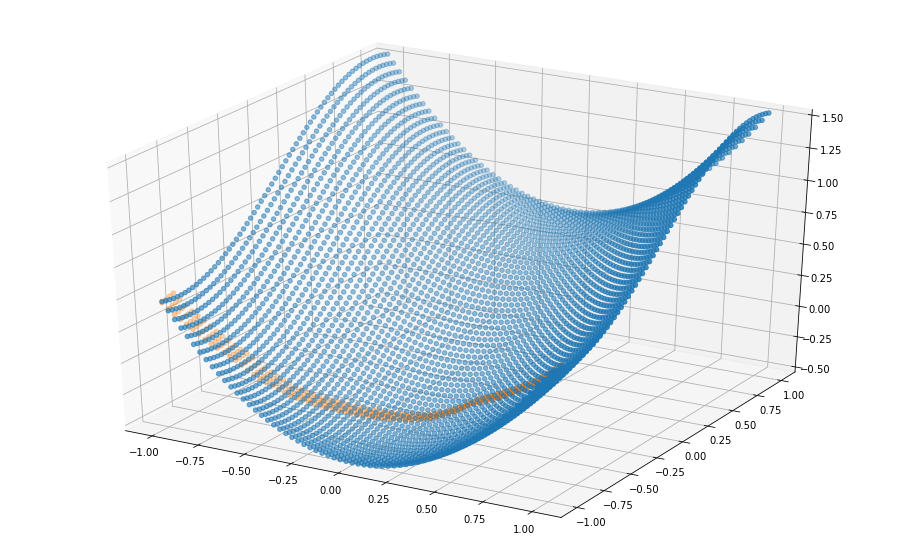

...

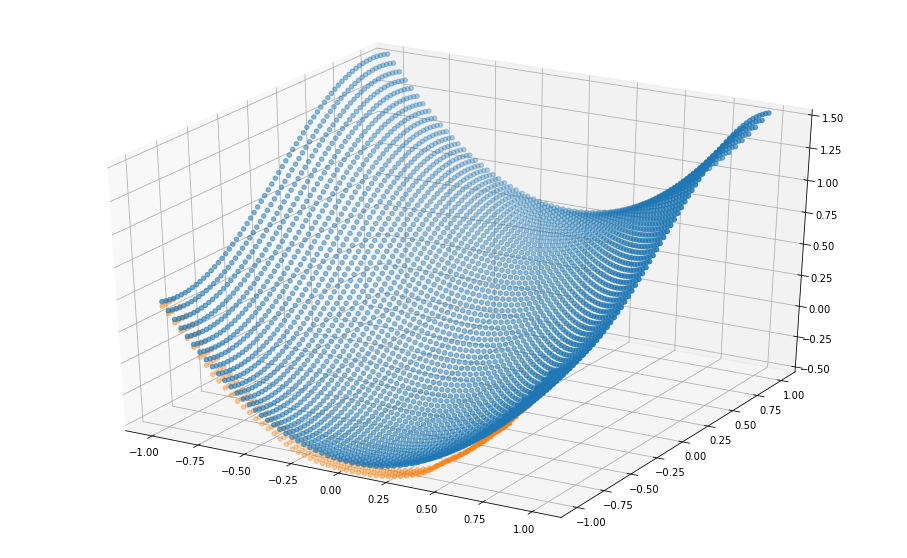

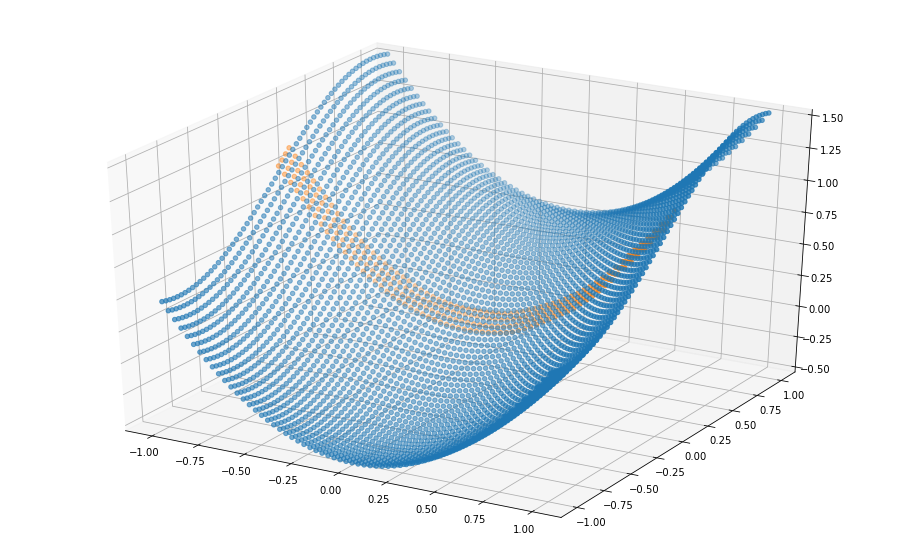

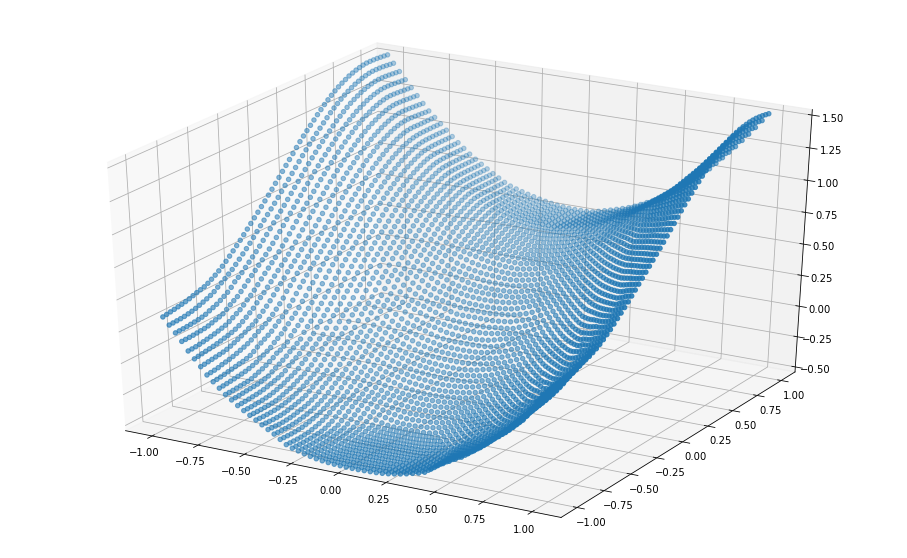

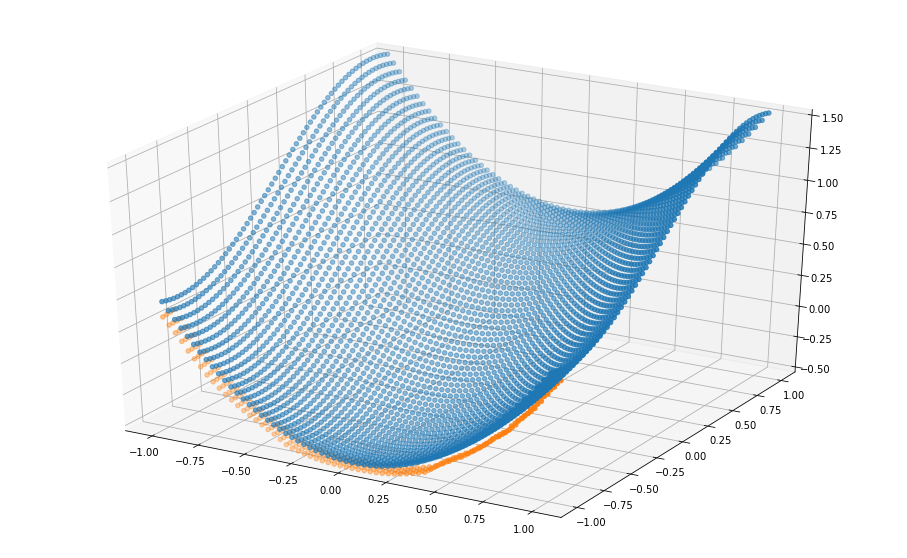

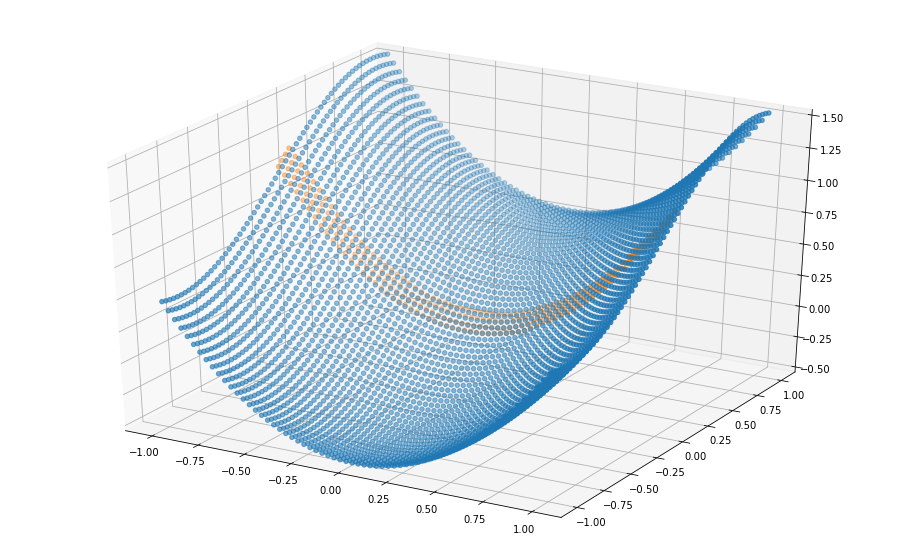

In [78]:
SHUFFLE = False

dev = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print("Device is", dev)

net = Net()
net.cuda()

data = torch.from_numpy(X)
data = data.to(dev)

criterion = nn.MSELoss()
optimizer = torch.optim.Adam(net.parameters())

EPSILON = 1e-8
batchsize = 256
#######


PAIRS = list(itertools.product(L, repeat=2))
full_inputs = torch.tensor(PAIRS).to(dev)
TARGETS = Z.flatten().reshape(-1, 1)
full_targets = torch.tensor(TARGETS).to(dev)

assert LINSPACE_SIZE**2 == len(PAIRS)
assert len(PAIRS) == len(TARGETS)


########################################


F_INPUTS = list(zip(*PAIRS))  # this is where the PAIRS get wrong
F_OUTPUTS = f(F_INPUTS[1], F_INPUTS[0])

F_EXPECTED_OUTPUTS =  TARGETS



assert len(F_INPUTS[0]) == len(F_INPUTS[1])
assert len(F_INPUTS[0]) == len(F_OUTPUTS)
assert len(F_INPUTS[0]) == len(PAIRS)

assert (abs(F_OUTPUTS - F_EXPECTED_OUTPUTS.squeeze()) < EPSILON).all(), abs(F_OUTPUTS - F_EXPECTED_OUTPUTS)


############## then SHUFFLE

if SHUFFLE:
    XYZ = list(zip(*F_INPUTS, F_OUTPUTS))
    random.seed(0)
    random.shuffle(XYZ)

    F_INPUTS0, F_INPUTS1, F_EXPECTED_OUTPUTS = zip(*XYZ)

    assert len(F_INPUTS[0]) == len(F_INPUTS[1])
    assert len(F_INPUTS[0]) == len(F_OUTPUTS)
    assert len(F_INPUTS[0]) == len(PAIRS)

    F_OUTPUTS = f(F_INPUTS1, F_INPUTS0)

    assert (abs(F_OUTPUTS - F_EXPECTED_OUTPUTS) < EPSILON).all(), abs(F_OUTPUTS - F_EXPECTED_OUTPUTS)
    REAL_INPUTS = F_INPUTS1, F_INPUTS0
    REAL_OUTPUTS = F_EXPECTED_OUTPUTS

    ########
else:
    REAL_INPUTS = F_INPUTS[1], F_INPUTS[0]
    REAL_OUTPUTS = F_EXPECTED_OUTPUTS
    
    
loss = None


Q, M = divmod(LINSPACE_SIZE**2, batchsize)

assert M == 0

input_dev = list()
target_dev = list()

for counter in range(0, Q):

    X_batch = REAL_INPUTS[1][counter*batchsize: (counter+1)*batchsize]
    Y_batch = REAL_INPUTS[0][counter*batchsize: (counter+1)*batchsize]

    XY_batch = [X_batch, Y_batch]

    Z_batch = REAL_OUTPUTS[counter*batchsize: (counter+1)*batchsize]

    assert len(Z_batch) == len(XY_batch[0]) == len(XY_batch[1])
    
    inputs = torch.tensor(XY_batch).T
    inputs = inputs.to(dev)
    
    targets = torch.tensor(Z_batch)
    targets = targets.to(dev)
    
    input_dev.append(inputs)
    target_dev.append(targets)


assert len(input_dev) == len(target_dev)
assert len(input_dev) == Q

assert all([k.shape == (batchsize, 2) for k in input_dev]), [k.shape  for k in input_dev]
assert all([k.shape == (batchsize, 1) for k in target_dev]), [k.shape  for k in target_dev]

RANGE = 1000

for epoch in range(RANGE):

    if epoch % divmod(RANGE,10)[0] == 0:
        
        print("EPOCH", epoch)
        
        predictions = net(full_inputs)
        
        fig = plt.figure(figsize=(16,10))
        ax = plt.axes(projection='3d')

        ax.set_zlim(ORIG_ZLIMS)
        
        EPOCH_Z = predictions.cpu().detach().numpy().reshape(LINSPACE_SIZE, LINSPACE_SIZE)
        ax.scatter(X, Y, EPOCH_Z)


        #MX = input_dev[counter].cpu().numpy()



        FULL_LOSS = criterion(predictions, full_targets)

        print(f"full loss {FULL_LOSS}")
    
    
    for counter in range(0, Q):

        optimizer.zero_grad()
        inputs = input_dev[counter] 
        outputs = net(inputs)
        
        targets = target_dev[counter]
        loss = criterion(outputs, targets)
        
        
        if epoch % divmod(RANGE,10)[0] == 0:
            
            counterd = max(divmod(Q, 2)[0], 1)
            
            if counter % counterd == 0:
                print(f"{epoch}# {counter+1} out of {Q} with loss", loss)
                
                
                 

                BATCH_XY = input_dev[counter].cpu().numpy()
                BATCH_X = BATCH_XY[:, 1]
                BATCH_Y = BATCH_XY[:, 0]
                
                BATCH_Z = outputs.cpu().detach().numpy().reshape(batchsize, 1)

                fig = plt.figure(figsize=(16,10))
                ax = plt.axes(projection='3d')
                ax.scatter(X, Y, Z)
                ax.scatter(BATCH_X, BATCH_Y, BATCH_Z)                
                ax.set_zlim(ORIG_ZLIMS)


        loss.backward()
        optimizer.step()
        
        